In [1]:
from matplotlib import pyplot as plt
from os import listdir
import pandas as pd

import tensorflow as tf
import numpy as np

from model import MonoexponentialModelP

%matplotlib inline

In [2]:
DATASET_PATH = 'dataset'
PLOTS_PATH = 'plots'
MODELS_PATH = 'models'

In [3]:
def get_file_names(datasets_folder=DATASET_PATH):
    return [datasets_folder + '/' + _ for _ in listdir(datasets_folder)]

In [4]:
def read_datasets(file_names):
    return [pd.read_csv(f_name,
                        header=0,
                        parse_dates=[0],
                        infer_datetime_format=True) 
            for f_name in file_names]

In [5]:
fnames = get_file_names()
df_list = read_datasets(fnames)

In [6]:
# for df in df_list:
#     plt.figure(figsize=(7,5))
#     plt.semilogx(df.frequency_hz, df.dlts_pf, '.g', label="Actual values", alpha=1)
#     plt.xlabel('Frequency, Гц')
#     plt.ylabel('DLTS, пФ')
#     plt.legend()
    
#     title = f'{df.specimen_name[0]} Т={df.temperature_k.mean():.1f} К, $U_1$={df.u1[0]} В, $U_R$={df.ur[0]} В'
#     plt.title(title)
    
#     plt.grid()
#     # plt.savefig('plots/monoexponential/p_experimental_data.svg')
#     plt.show()

In [7]:
def fit_model(dlts, frequency, f_pulse, learning_rate=0.1, batch_size=None, epochs=1, return_history=True):
    
    
    freq_values = frequency.copy()
    dlts_values = dlts.copy()
    
    max_abs_index = np.absolute(dlts_values).argmax()
    extrem_val = dlts_values[max_abs_index]
    
    new_max_dlts = np.log10(freq_values.max())

    normalize = lambda x: x / extrem_val * new_max_dlts
    denormalize = lambda x: x * extrem_val / new_max_dlts
    
    dlts_values = normalize(dlts_values)

    initial_time_constant = float(-np.log10(freq_values[max_abs_index]))
    initial_amplitude = float(dlts_values[max_abs_index])
    
    f_pulse_value = float(f_pulse) * 10 ** (-6)
    
    
    initial_model = MonoexponentialModelP(filling_pulse=f_pulse_value,
                                          time_constant_power=initial_time_constant,
                                          amplitude=initial_amplitude)
    
    final_model = MonoexponentialModelP(filling_pulse=f_pulse_value,
                                        time_constant_power=initial_time_constant,
                                        amplitude=initial_amplitude
                                       )
    
    
    final_model.compile(run_eagerly=False,
                        loss=tf.keras.losses.MSE,
                        optimizer=tf.optimizers.SGD(learning_rate=learning_rate)
                       )
    
    history = final_model.fit(freq_values, 
                              dlts_values, 
                              epochs=epochs, 
                              batch_size=batch_size, 
                              verbose=False
                             )
    
    
    dlts_values = denormalize(dlts_values)
    initial_model.amplitude = denormalize(initial_model.amplitude)
    final_model.amplitude = denormalize(final_model.amplitude)
    
    out = [freq_values, dlts_values, initial_model, final_model]
    if return_history:
        out.append(history)
    
    return out

In [8]:
def print_results(frequency, actual_dlts, initial_model, final_model, history = None,):
    
    if not (history is None):
        fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5))
    else:
        fig, ax0 = plt.subplots(1, 1, figsize=(7,5))
        
    ax0.semilogx(frequency, actual_dlts, '.g', label="Actual values", alpha=0.3)
    ax0.semilogx(frequency, initial_model(frequency), '-.b', label="Initial model", alpha=0.5)
    ax0.semilogx(frequency, final_model(frequency), 'r', label="Final model")
    
    ax0.set_xlabel('Frequency, Hz')
    ax0.set_ylabel('DLTS, pF')
    ax0.legend()
    ax0.grid()

    if not (history is None):
        loss = np.array(history.history['loss'])
        norm_loss = loss/loss.max()
        
        ax1.plot(norm_loss)
        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('Normalized Mean Squared Error')
        plt.ylim([0, max(plt.ylim())])
        ax1.grid()
    
    if not ((final_model is None) or (history is None)):
        return fig, (ax0, ax1)
    else:
        return fig, ax0

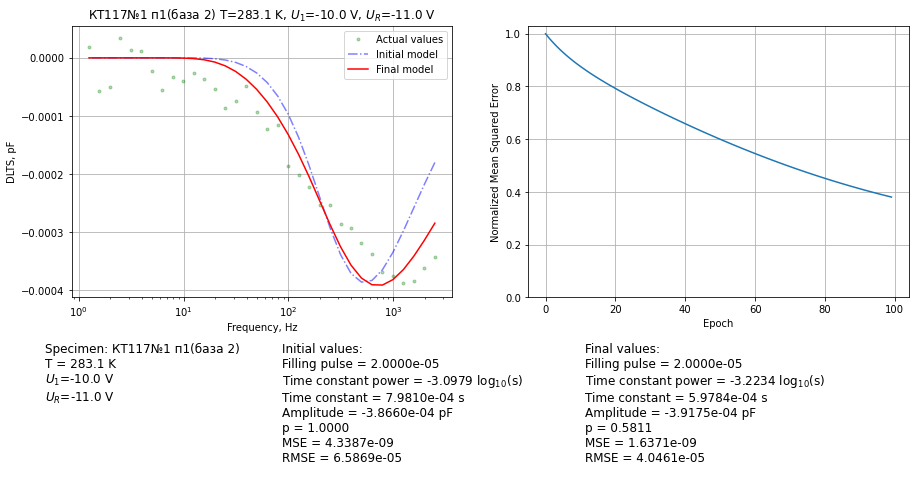

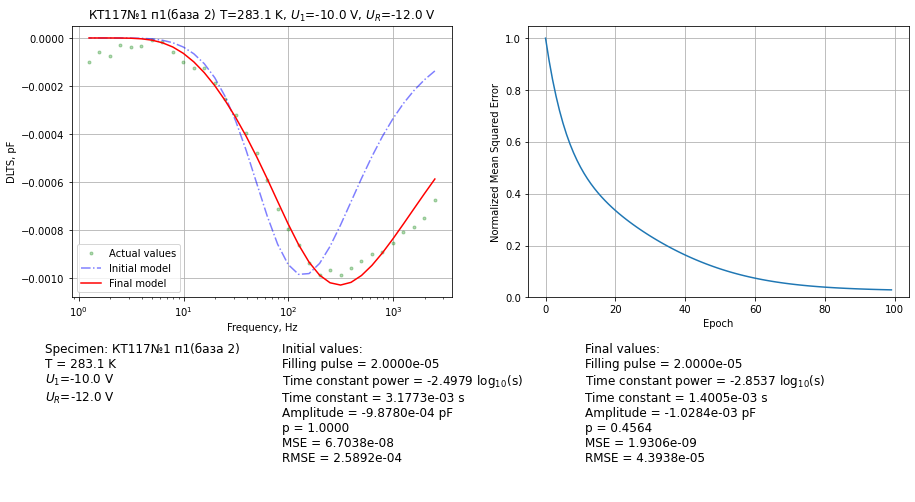

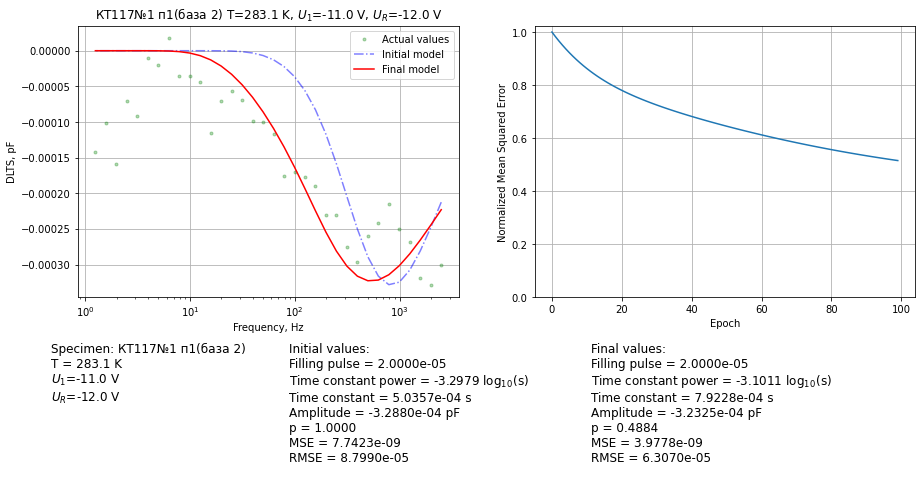

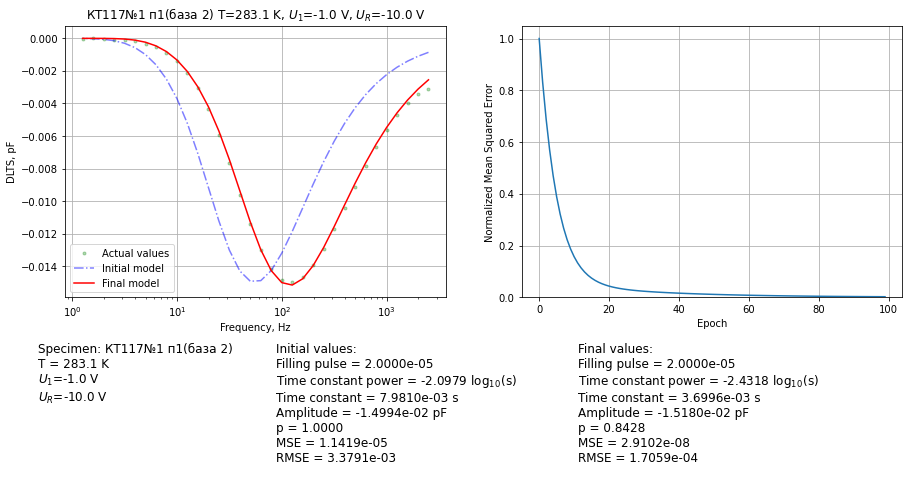

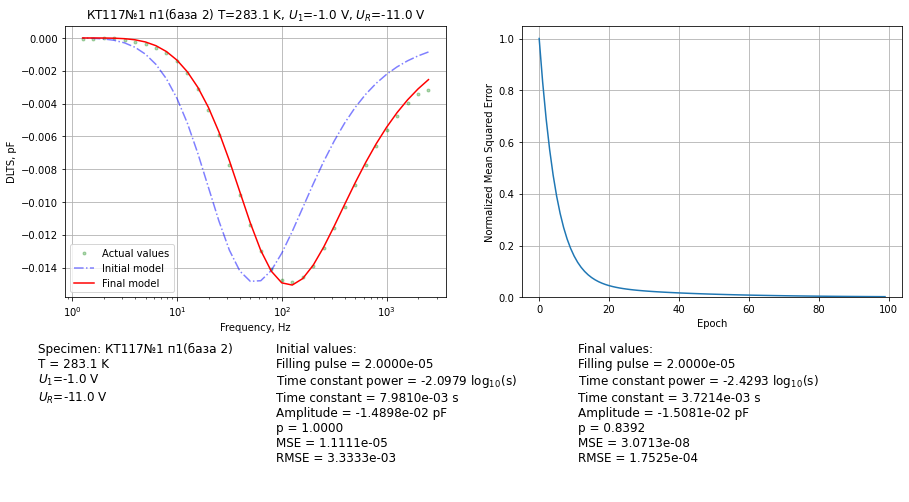

...

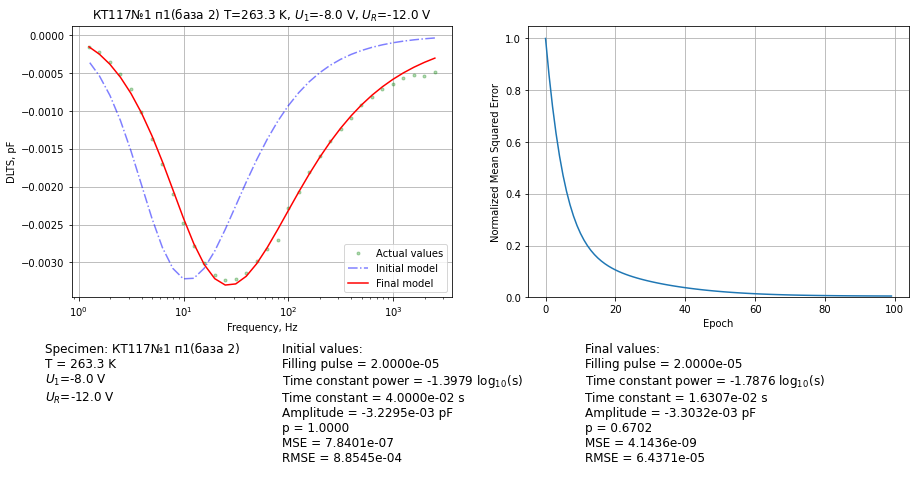

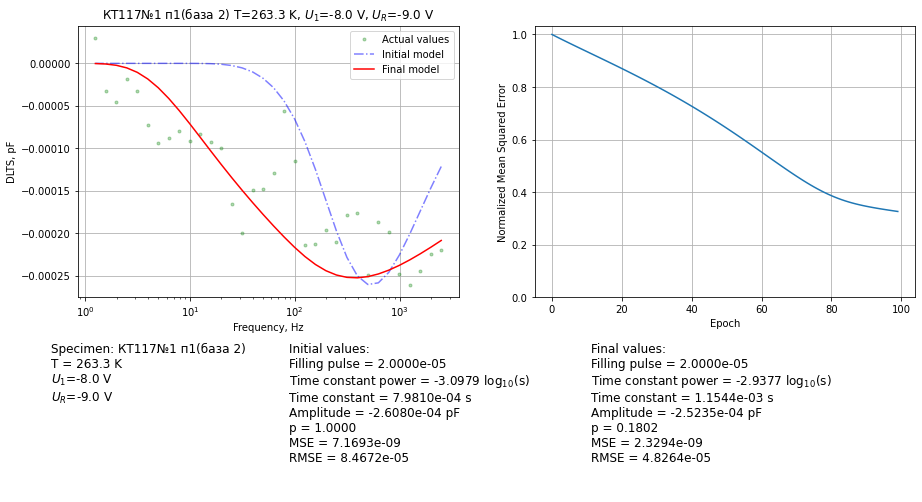

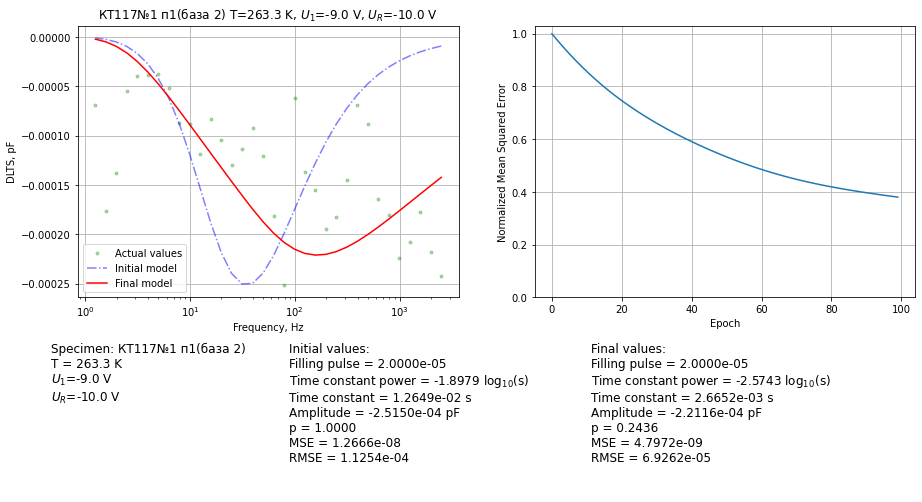

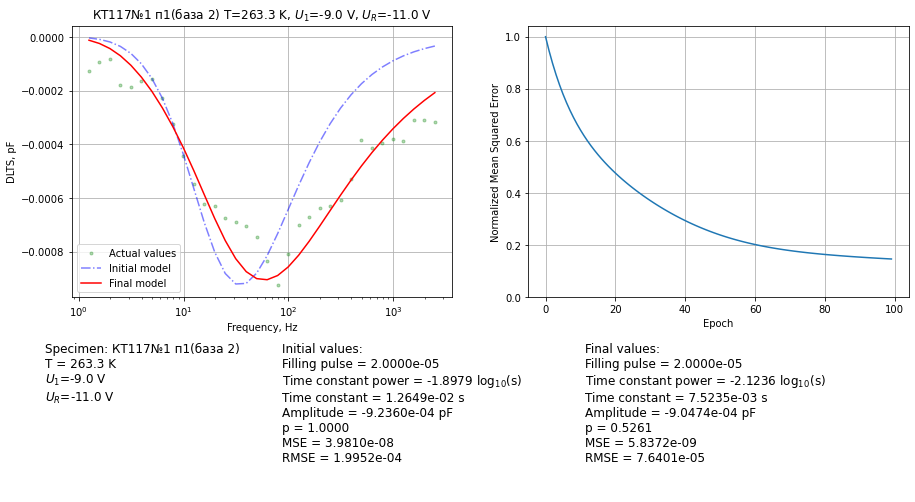

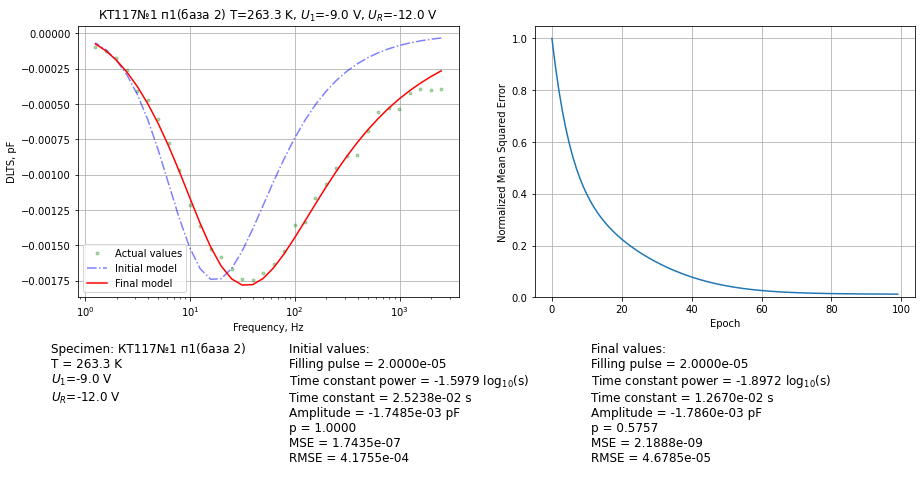

In [9]:
LEARNING_RATE = 0.01
BATCH_SIZE = 100
EPOCHS = 100

for df in df_list:
    
    freq_values, dlts_values, initial_model, final_model, history = fit_model(dlts=df.dlts_pf.values, 
                                                                              frequency=df.frequency_hz.values, 
                                                                              f_pulse=df.f_pulse[0], 
                                                                              learning_rate=LEARNING_RATE, 
                                                                              batch_size=BATCH_SIZE, 
                                                                              epochs=EPOCHS
                                                                             )
    
    fig, ax = print_results(frequency = freq_values,
                            actual_dlts = dlts_values,
                            initial_model = initial_model,
                            final_model = final_model,
                            history = history
                           )
    
    title = f'{df.specimen_name[0]} T={df.temperature_k.mean():.1f} K, $U_1$={df.u1[0]} V, $U_R$={df.ur[0]} V'
    ax[0].set_title(title)
    
    
    def text_params(model, actual_dlts, frequency):
        time_constant_power = model.time_constant_power.numpy()
        f_pulse = model.filling_pulse.numpy()
        p = model.p_coef.numpy()
        amp = model.amplitude.numpy()
        mse = tf.keras.metrics.mean_squared_error(actual_dlts, model(frequency))

        text = '\n'.join([f'Filling pulse = {f_pulse:.4e}',
                          f'Time constant power = {time_constant_power:.4f} log$_1$$_0$(s)',
                          f'Time constant = {10**time_constant_power:.4e} s',
                          f'Amplitude = {amp:.4e} pF',
                          f'p = {p:.4f}',
                          f'MSE = {mse:.4e}',
                          f'RMSE = {tf.sqrt(mse):.4e}',
                          '\n'])
        
        return text

    
    text_1 = '\n'.join([f'Specimen: {df.specimen_name[0]}',
                        f'T = {df.temperature_k.mean():.1f} K',
                        f'$U_1$={df.u1[0]} V',
                        f'$U_R$={df.ur[0]} V\n'])
    
    text_2 = '\n'.join(['Initial values:', text_params(initial_model, dlts_values, freq_values)])
    text_3 = '\n'.join(['Final values:', text_params(final_model, dlts_values, freq_values)])
    
    fontsize=12
    plt.gcf().text(0.1, 0, text_1, fontsize=fontsize, verticalalignment='top')
    plt.gcf().text(0.32, 0, text_2, fontsize=fontsize, verticalalignment='top')
    plt.gcf().text(0.6, 0, text_3, fontsize=fontsize, verticalalignment='top')

    # plt.savefig('plots/monoexponential/p_SGD.svg')
    plt.show()